In [1]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [2]:
# define 15 tickers to use
tickers_list = ['AAPL', 'MSFT', 'WMT', 'IBM', 'MU', 'BA', 'AXP',  'NVDA', 'FB', 'OXY', 'TSLA', 'JNJ', 'NFLX', 'DIS']
from_date, to_date = '2014-03-01','2019-03-01'

In [3]:
def get_close_prices(tick_list, from_date, to_date):
    return yf.download(tickers_list, from_date, to_date )['Adj Close']
    
data_set_df = get_close_prices(tickers_list, from_date, to_date )
data_set_df.head()

[*********************100%***********************]  14 of 14 completed


,AAPL,AXP,BA,DIS,FB,IBM,JNJ,MSFT,MU,NFLX,NVDA,OXY,TSLA,WMT
Date,,,,,,,,,,,,,,
2014-02-28,67.710892,82.985603,109.956337,74.370750,68.459999,143.043030,77.661484,33.542198,24.190001,63.661430,17.468288,68.488167,244.809998,63.410374
2014-03-03,67.906464,81.794632,109.359322,73.128334,67.410004,142.340057,77.189392,33.078148,24.480000,63.655716,17.382755,68.154655,250.559998,62.918026
2014-03-04,68.354248,84.194740,111.073647,75.199028,68.800003,144.024139,78.690002,33.629753,25.110001,64.997147,17.563324,68.984871,254.839996,63.775372
2014-03-05,68.498352,83.767448,109.845436,76.091743,71.570000,144.564880,78.057709,33.367085,24.830000,64.785713,17.715389,68.722313,252.660004,63.495262
2014-03-06,68.291168,85.022049,109.905167,76.699165,70.839996,144.951080,78.310631,33.402107,24.770000,64.358574,17.468288,68.844971,252.940002,63.563164


In [4]:
# Missing values persentage
miss_prc = data_set_df.isnull().sum()/data_set_df.shape[0]
miss_val_tick = data_set_df.columns[data_set_df.isnull().sum()!=0]#.tolist()
print('Percentage of missing values; \n', miss_prc)

Percentage of missing values; 
 AAPL    0.0
AXP     0.0
BA      0.0
DIS     0.0
FB      0.0
IBM     0.0
JNJ     0.0
MSFT    0.0
MU      0.0
NFLX    0.0
NVDA    0.0
OXY     0.0
TSLA    0.0
WMT     0.0
dtype: float64


The missing values for `BABA` are ~10%. We are going to study the case that there is high correlation with some other ticker, so as to avoid removing `BABA` from the dataset.

In [5]:
# Find the correlation between columns with missing values and the rest of the dataframe
for ticker in miss_val_tick:
    corr_df = data_set_df[data_set_df.columns].apply(lambda x: x.corr(data_set_df[ticker])).sort_values(ascending = False)
    print('Correlation for ticker:',ticker,'\n')
    print(corr_df)

### Overview of the dataset 

Text(0, 0.5, 'Price')

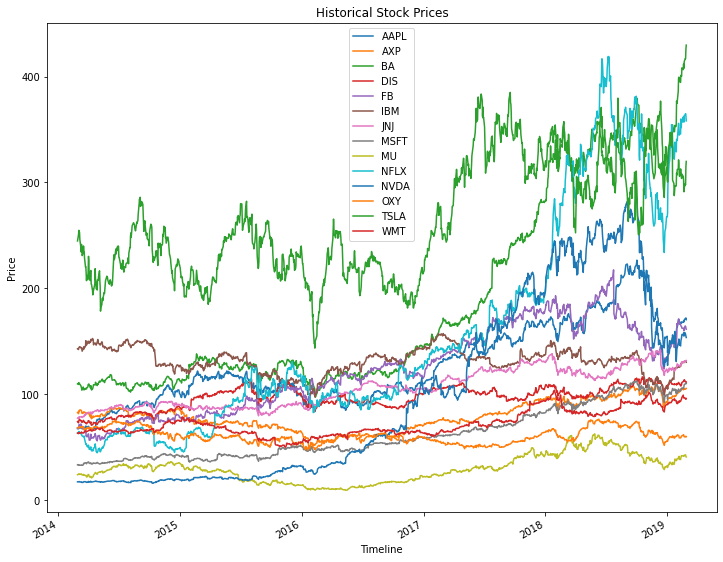

In [7]:
data_set_df.plot(figsize = (12,10), title = 'Historical Stock Prices')
plt.xlabel('Timeline')
plt.ylabel('Price')

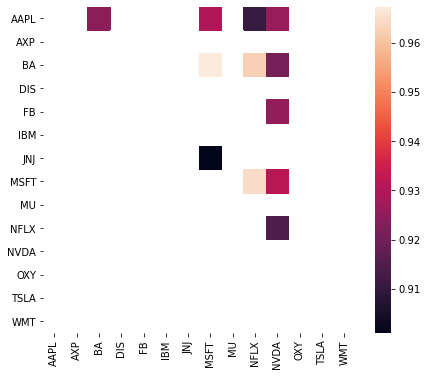

In [8]:
# Self-Corelation Heatmap 
corr = data_set_df.corr()
dataCorr = corr.mask(np.tril(np.ones(corr.shape)).astype(np.bool))
mask = np.where(dataCorr<0.9, True, False)
plt.figure(figsize = (7,6))
sns.heatmap(dataCorr, mask = mask)

# Crossover Moving Average

In [9]:
new_tickers_list = data_set_df.columns.tolist()
MA_df = data_set_df.copy()

## Main class

In [10]:
class Trader:
    def __init__(self, df, rsi_win, long_win, short_win, tickers):
        self.df = df     
        self.rsi_win = rsi_win
        self.long_win = long_win 
        self.short_win = short_win
        self.tickers = tickers
        self.portfolio = pd.DataFrame(int(0), index = self.df.index, columns = [x+y for x #
                                                 in tickers for y \
                                                 in ['','_signal_tday',\
                                                     '_Position_t-1',  '_SharePrice_t-1',\
                                                     '_Position_tday', '_Return', '_Profitable', '_Action'  ] ]  + ['Sum_Profitables', 'Sum_Actions',  'PnL', 'cumpnl', 'Daily_Return', 'profit_pc', 'Portfolio_Value', 'transaction_cost'])
    def EMA_features(self, col):
        self.df[f'{col}_{self.long_win}_EMA'] = self.df[col].ewm(span = self.long_win).mean()
        self.df[f'{col}_{self.short_win}_EMA'] = self.df[col].ewm(span = self.short_win).mean()

    def RSI_feature(self, col):
        diff = self.df[col].diff(1).dropna()
        up_chg = 0 * diff
        down_chg = 0 * diff
        up_chg[diff > 0]  = diff[ diff>0 ]
        down_chg[diff < 0] =  diff[ diff < 0 ]
        up_chg_avg   = up_chg.ewm(com=self.rsi_win-1 , min_periods=self.rsi_win).mean()
        down_chg_avg = down_chg.ewm(com=self.rsi_win-1 , min_periods=self.rsi_win).mean()
        rs = abs(up_chg_avg/down_chg_avg)
        rsi = 100 - 100/(1+rs)
        self.df[f'{col}_{self.rsi_win}_RSI'] = rsi

    def gen_feature_table(self, print = False):
        for ticker in self.tickers:
            self.RSI_feature(ticker)
            self.EMA_features(ticker)
        self.df = self.df.reindex(sorted(self.df.columns), axis=1)
        if print:
            self.plot_features(self.df)
            
    def plot_features(self, df):
        fig, ax = plt.subplots(nrows=len(self.tickers)//2, ncols= 2, figsize=(40, 30))
        idx = 0
        for row in ax:
            for col in row:
                ticker = self.tickers[idx]
                col.plot(df.index, df[f'{ticker}'],  color = 'black',  label='Close Price')
                col.plot(df.index, df[f'{ticker}_12_EMA'], label='10 Days EMA', color='blue')
                col.plot(df.index, df[f'{ticker}_5_EMA'], label='5 Days EMA', color='green')
                col.plot(df.index, df[f'{ticker}_14_RSI'], label='14 Days RSI', color='red')
                col.title.set_text(ticker + ' MA crossover plot')
                col.legend(loc='upper left')
                idx+=1
 
                
    def gen_portfolio(self, capital, rsi_low, rsi_high, clear = True, plot = False ):
        """
        Gen signals only after generating features. Return dataframe with needed info for trading action.
        """
        #self.portfolio.iloc[0] = 0
        if clear:
            self.portfolio[ [y+x for x in\
                            ['_Return', '_Position_tday', '_signal_tday', '_Position_t-1' ] \
                            for y in self.tickers] + ['PnL', 'cumpnl'] ] = 0
        self.portfolio['Remaining_Capital'] = capital
        for ticker in self.tickers:
            self.portfolio[f'{ticker}_signal_tday'] =  np.where(((self.df[f'{ticker}_{self.short_win}_EMA'] >= self.df[f'{ticker}_{self.long_win}_EMA']) &
                                                                 (self.df[f'{ticker}_{self.rsi_win}_RSI'] >= rsi_high)), 'Buy', np.where((self.df[f'{ticker}_{self.short_win}_EMA'] < self.df[f'{ticker}_{self.long_win}_EMA']) &
                                                                 (self.df[f'{ticker}_{self.rsi_win}_RSI'] <= rsi_low), 'Sell', 'Hold'))
            self.portfolio[f'{ticker}'] = self.df[f'{ticker}'].values
            self.portfolio[f'{ticker}_SharePrice_t-1'] = self.df[f'{ticker}'].shift(1).values
        return self.portfolio
            
            
    def trade(self, tradedate):
        
        idx = self.portfolio.index.get_loc(tradedate)
        
        for ticker in self.tickers:
            tick_pos = str(ticker) + '_Position_tday'
            t_1_pos = str(ticker) + '_Position_t-1'
            sig_day = str(ticker) + '_signal_tday'
            
            previous_pos = self.portfolio.iloc[idx-1][tick_pos]
            previous_price = self.portfolio.iloc[idx-1][ticker].astype(float)
            t_2_price = self.portfolio.iloc[idx-2][ticker].astype(float)
            
            self.portfolio.at[tradedate, t_1_pos ] = previous_pos
            signal = self.portfolio.loc[(self.portfolio.index == tradedate)][sig_day].item()
            #print(ticker + ' Signal--> ', signal)
            
            if  previous_pos >=1 :
                if (self.portfolio.loc[(self.portfolio.index == tradedate)][sig_day] == 'Sell').bool():       
                    self.portfolio.at[tradedate, tick_pos ] = previous_pos - 1
                    self.portfolio.at[tradedate, 'Remaining_Capital' ] = \
                                        self.portfolio.at[tradedate, 'Remaining_Capital'] + t_2_price
                elif (self.portfolio.loc[(self.portfolio.index == tradedate)][sig_day] == 'Buy').bool():            
                    self.portfolio.at[tradedate, tick_pos] = previous_pos + 1
                    self.portfolio.at[tradedate, 'Remaining_Capital' ] = self.portfolio.at[tradedate, 'Remaining_Capital'] - t_2_price
                elif (self.portfolio.loc[(self.portfolio.index == tradedate)][sig_day] == 'Hold').bool():
                    self.portfolio.at[tradedate, tick_pos] = previous_pos
    
                self.portfolio.at[tradedate, [ticker + '_Return'] ] =\
                            (previous_price.item() - t_2_price) * \
                                    np.where(signal == 'Buy', 1, np.where(signal == 'Sell', -1, 0))/(t_2_price)

            elif  previous_pos == 0:              
                if self.portfolio.loc[tradedate, [sig_day]].item() == 'Buy':
                    self.portfolio.at[tradedate, [tick_pos]] = previous_pos + 1
                    self.portfolio.at[tradedate, 'Remaining_Capital' ] = self.portfolio.at[tradedate, 'Remaining_Capital'] - t_2_price
                elif (self.portfolio.loc[(self.portfolio.index == tradedate)][sig_day] == 'Hold').bool():
                    self.portfolio.at[tradedate, tick_pos] = previous_pos
                elif (self.portfolio.loc[(self.portfolio.index == tradedate)][sig_day] == 'Sell').bool():
                    self.portfolio.at[tradedate, tick_pos] = previous_pos
                    self.portfolio.at[tradedate, 'Remaining_Capital' ] = self.portfolio.at[tradedate, 'Remaining_Capital'] + t_2_price
                    
                self.portfolio.at[tradedate, [ticker + '_Return'] ] = 0

            
            # Profitable trade 
            self.portfolio.at[tradedate,  [ticker + '_Profitable']] = np.where(self.portfolio.loc[tradedate,  ticker + '_Return'].item() >0, 1, 0)  
            self.portfolio.at[tradedate,  [ticker + '_Action']] = np.where( self.portfolio.loc[tradedate,  sig_day] != 'Hold', 1 , 0)

        # PnL
        self.portfolio.at[tradedate,  'PnL'] = self.PnL(tradedate = tradedate)  
        # Cumulative PnL
        self.portfolio['cumpnl'] = self.portfolio['PnL'].cumsum()
        self.portfolio.at[tradedate,  'Daily_Return'] = self.daily_return_per_share(tradedate) 
        

        self.portfolio.at[tradedate,  'Portfolio_Value'] = self.portfolio_value(tradedate)
        if idx>1:
            self.portfolio.at[tradedate,  'cum_Return'] = self.portfolio.iloc[:idx+1]['Daily_Return'].cumsum(skipna = True).values[-1]
        else:
            self.portfolio.at[tradedate,  'cum_Return'] = 0
        
        
        
        # Total Number of profitable trades
        self.portfolio.at[tradedate,  'Sum_Profitables'] = self.portfolio.loc[tradedate,  [ticker + '_Profitable' for ticker in self.tickers]].sum()
        # Total Number of trades
        self.portfolio.at[tradedate,  'Sum_Actions'] = self.portfolio.loc[tradedate,  [ticker + '_Action' for ticker in self.tickers]].sum()
        # Percentage of profitable trades
        self.portfolio.at[tradedate, 'profit_pc'] = self.portfolio['Sum_Profitables'].cumsum()[-1]/ self.portfolio['Sum_Actions'].cumsum()[-1]

        return self.portfolio
    

    
    def PnL(self, tradedate):
        """
        Generate PnL 
        """
        return_cols = [x + '_Return' for x in self.tickers]
        pos_cols = [x + '_Position_t-1' for x in self.tickers]
        
        return (self.portfolio.loc[tradedate, return_cols].mul(self.portfolio.loc[ tradedate, pos_cols ].tolist())).sum()
    
    def daily_return_per_share(self, tradedate):
        return self.portfolio.loc[ tradedate , [x + '_Return' for x in self.tickers] ].sum()
    

            
    def portfolio_value(self, tradedate):
        port_value = self.portfolio.loc[tradedate,  ['PnL']].item() +\
            self.portfolio.loc[tradedate,  ['Remaining_Capital']].item()
        return_cols = [x + '_Return' for x in self.tickers]

        tcols = [x + '_Position_tday' for x in tickers_list]

        #return port_value
        return sum(self.portfolio.loc[tradedate, tcols].mul(self.portfolio.loc[ tradedate, self.tickers ].values)) + \
                    self.portfolio.loc[tradedate,  ['Remaining_Capital']].item()
        



### Optimize Parameters

We search for RSI parameters that maximize a metric between portfolio value, daily return, PnL

14 10 5


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 30 5


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 30 15


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 30 25


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 50 5


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 50 15


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 50 25


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 50 35


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 70 5


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 70 15


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 70 25


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


14 70 35


C:\Users\andre\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in longlong_scalars


Executon Time 0:26:40.470181


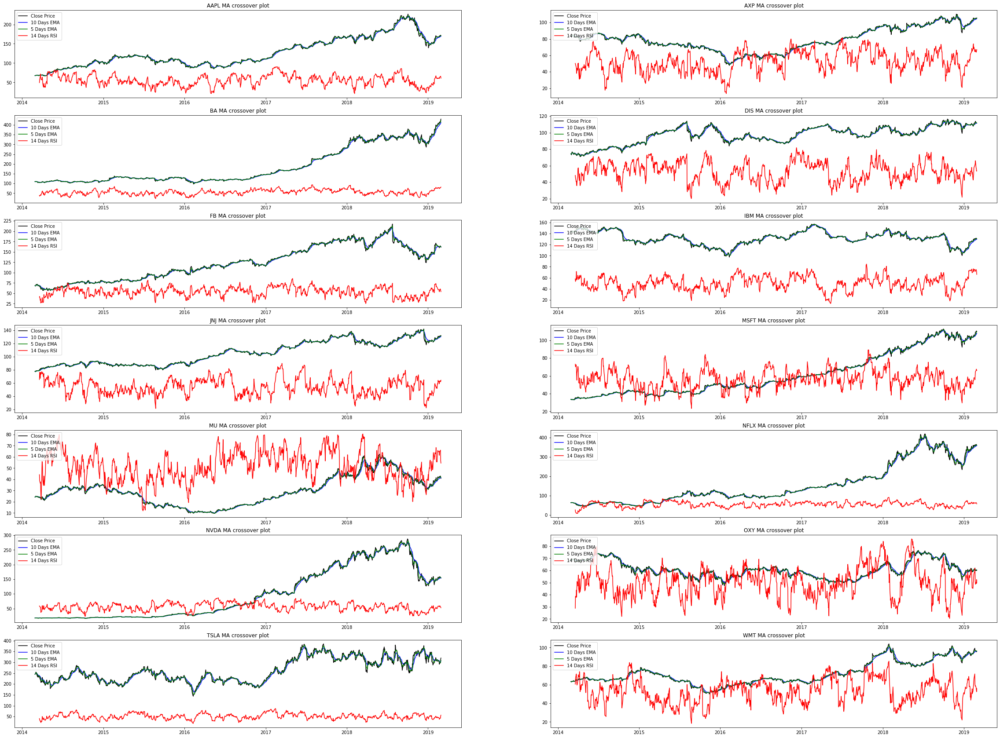

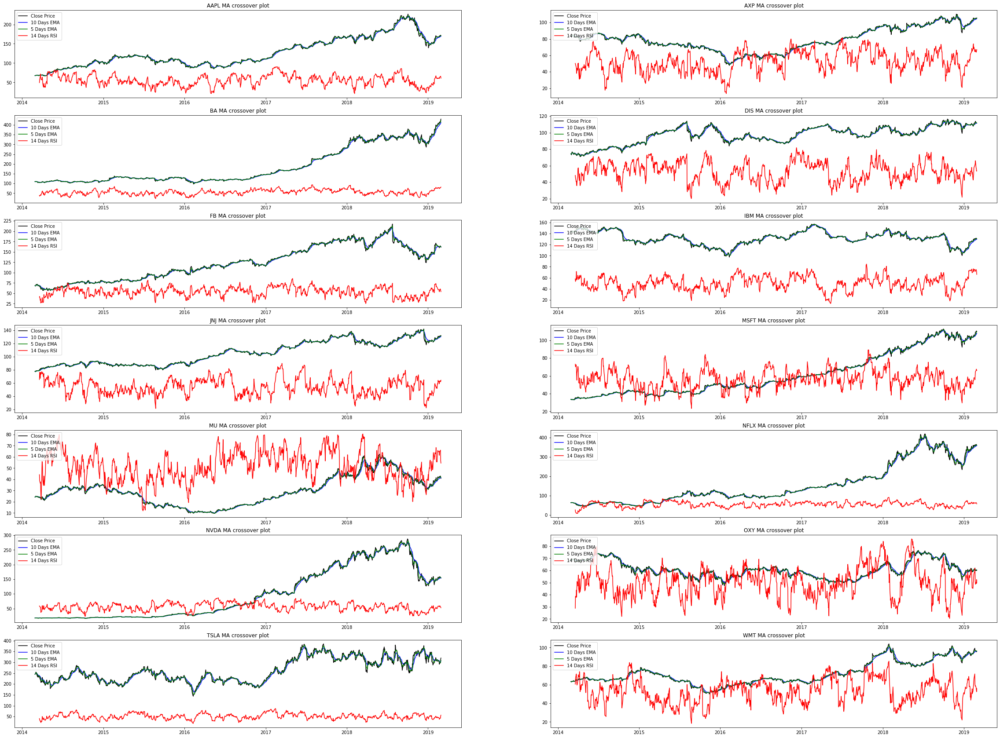

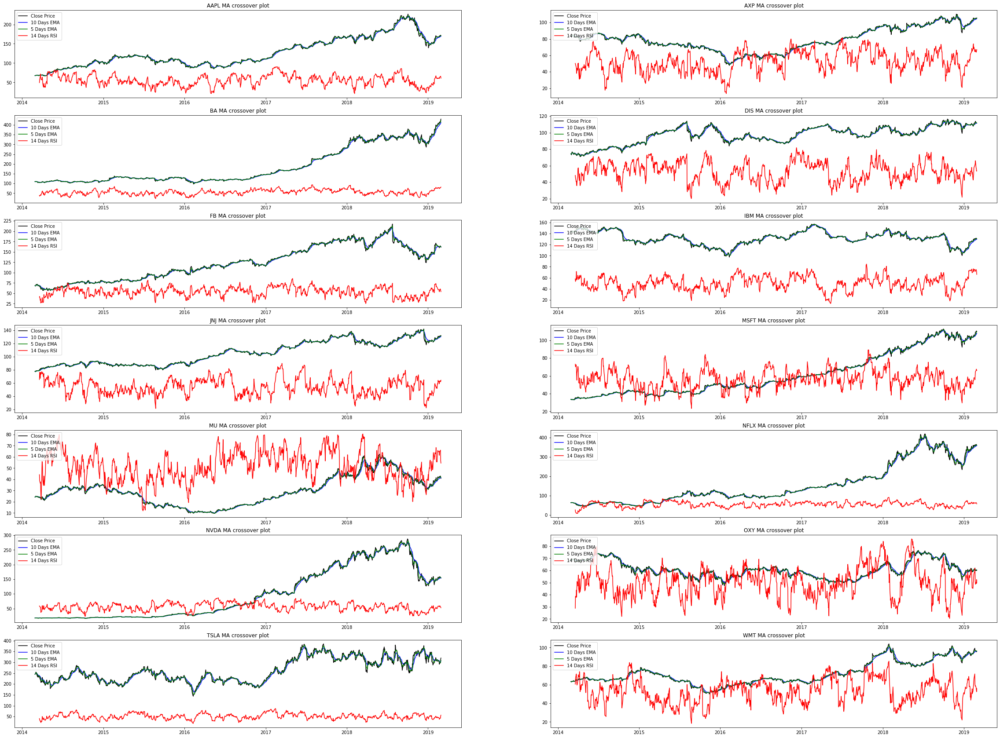

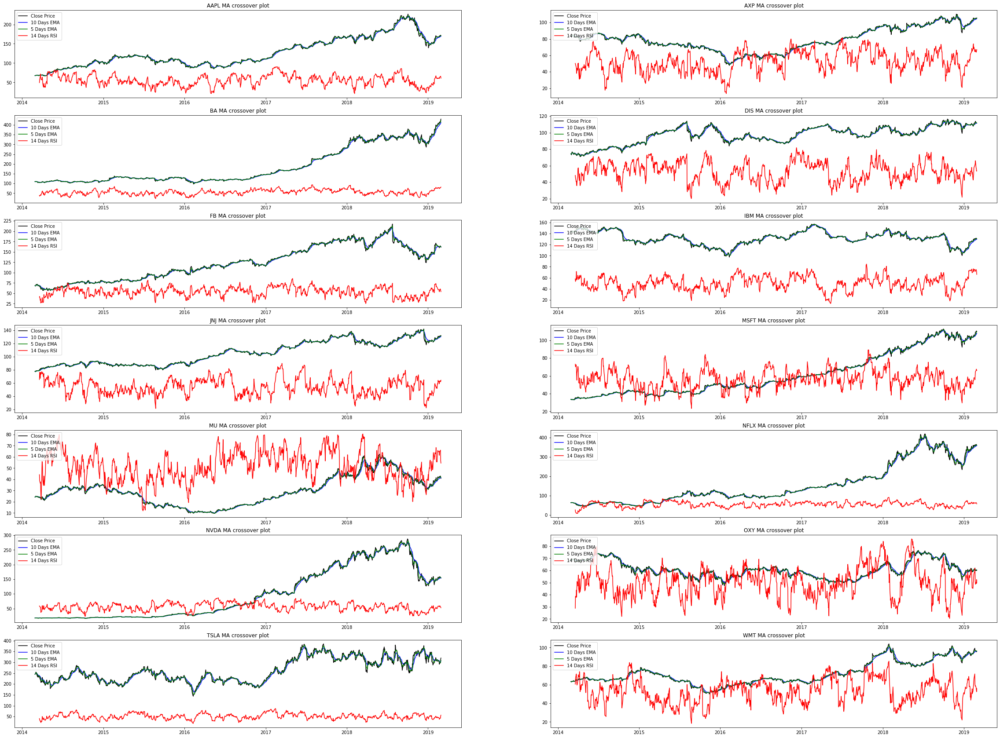

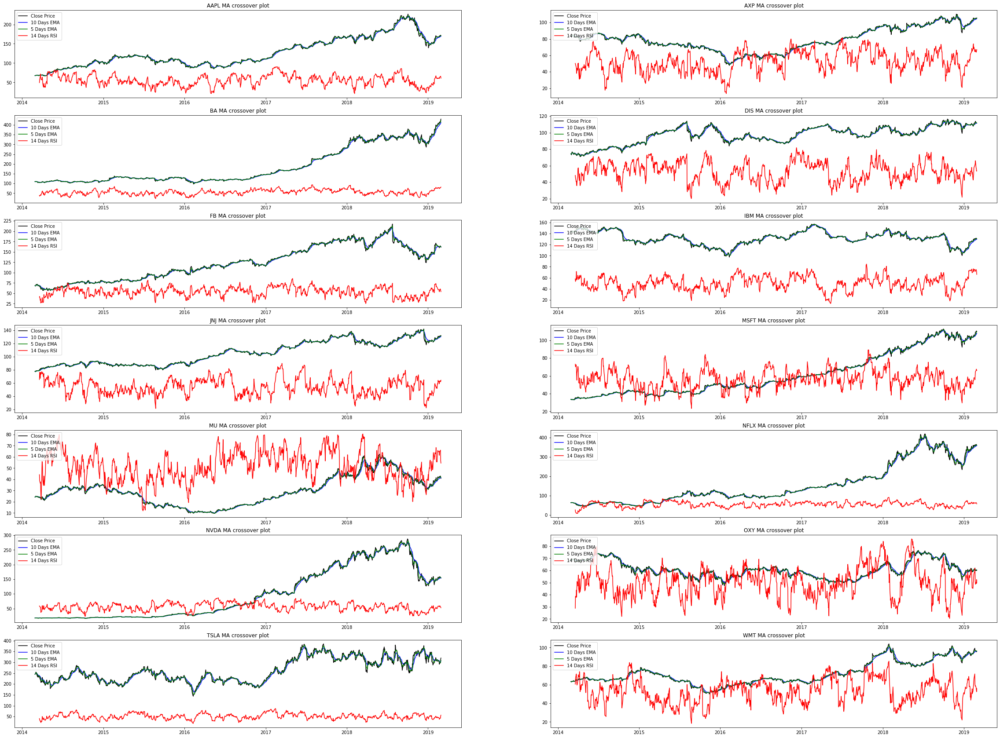

...

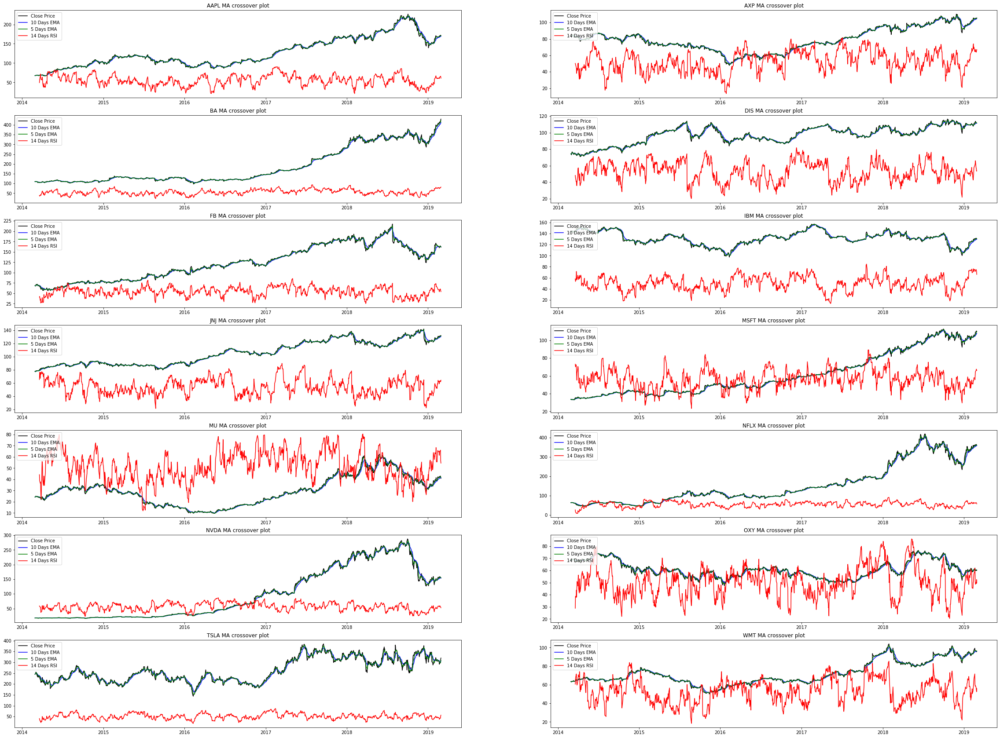

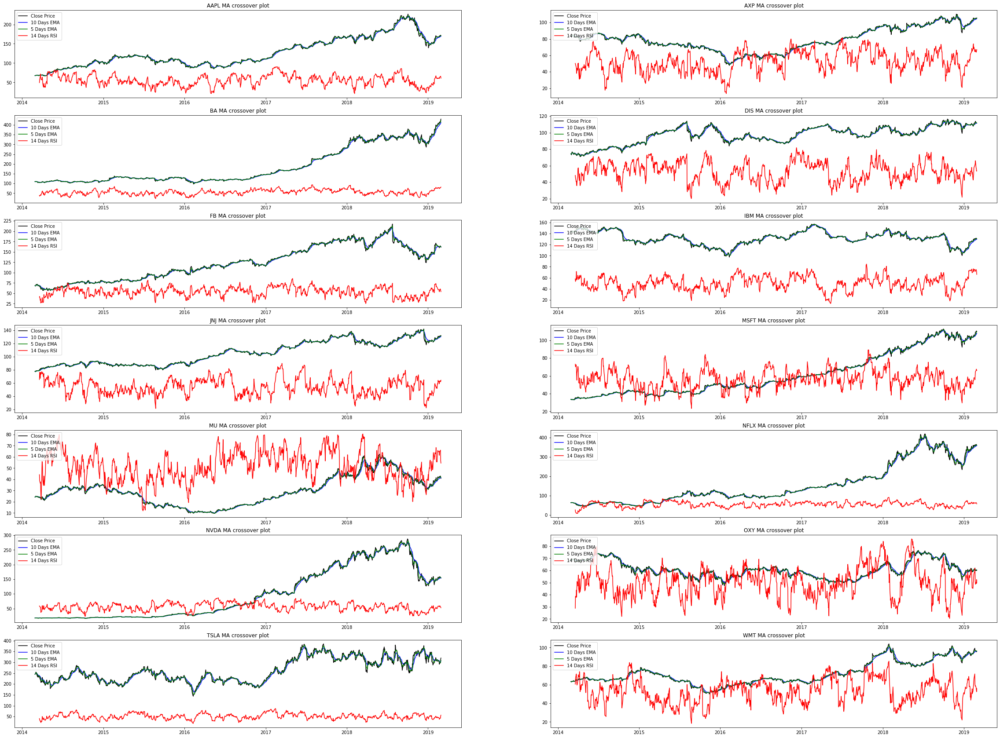

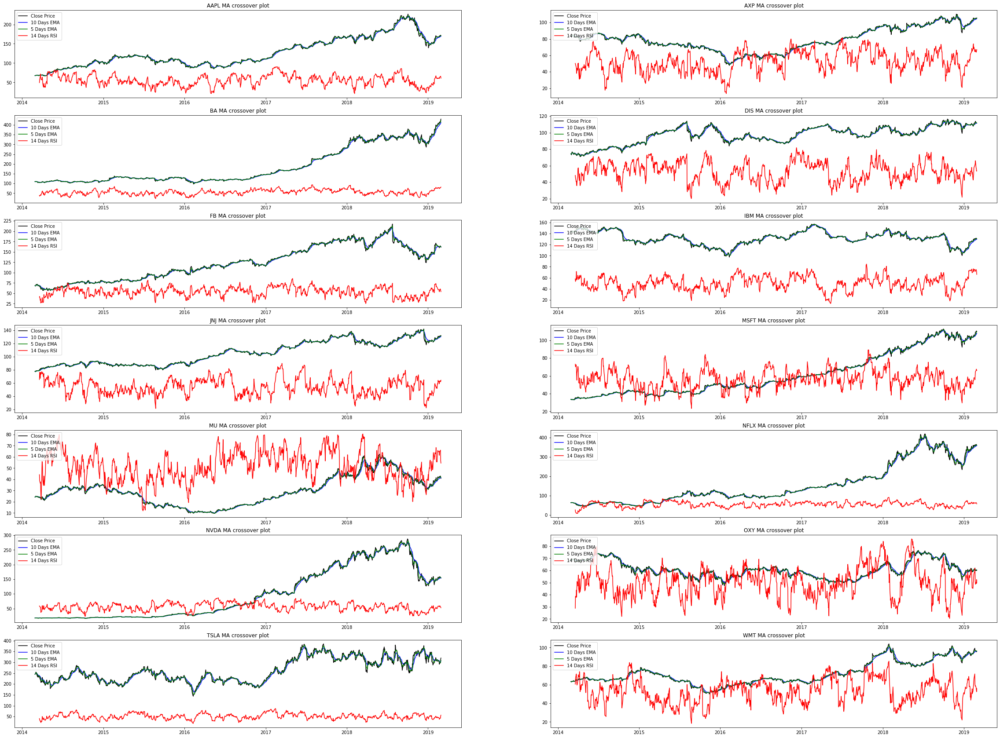

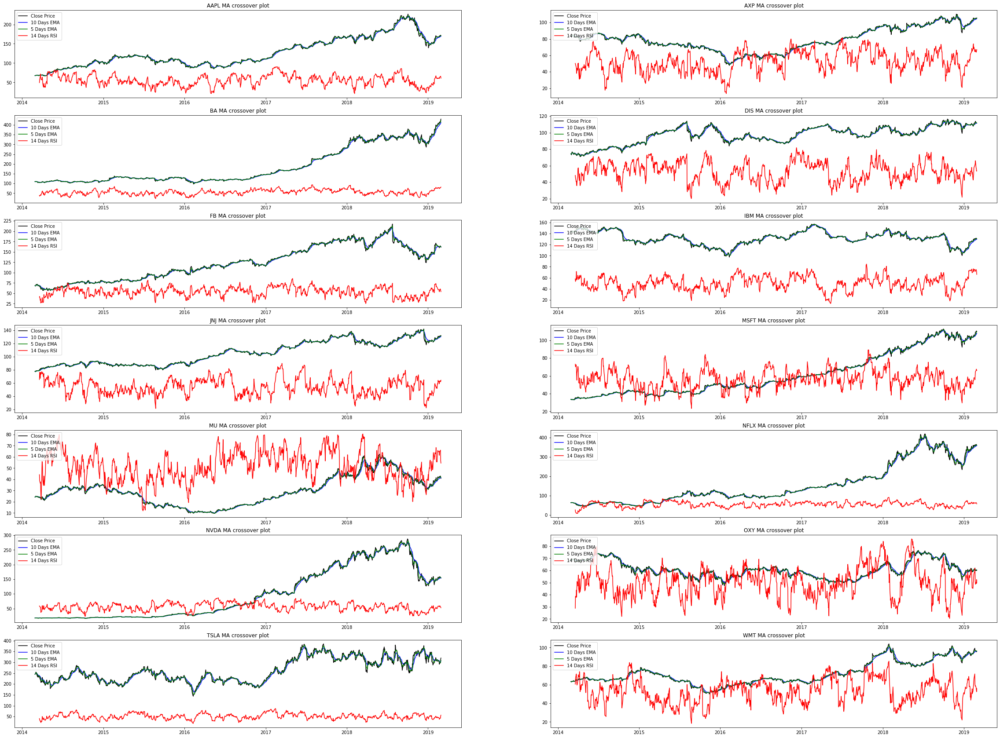

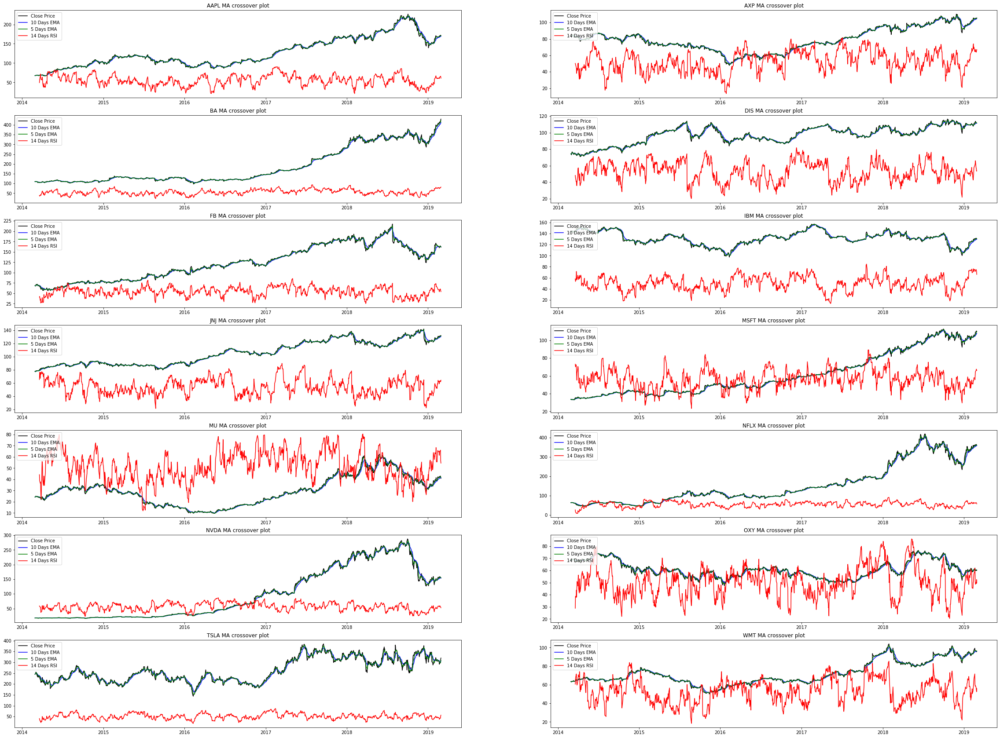

In [15]:
import datetime
time = datetime.datetime.now()
pc_profit_best = -99
d_return = 0.
port_value_best = 0
d_return_best = 0
sharpe_low_limit = 0
sharpe_high_limit = 0
rsi_Value = 0
MA_fast = 0
MA_slow = 0

low_list = [70]
high_list = [30]
rsi_list = [14]
slow_MA_list = [x for x in range(10, 90, 20)]
fast_MA_list = [x for x in range(5, 45, 10)]


for rsi in rsi_list:
    for slow in slow_MA_list:
        for fast in fast_MA_list:
            if fast>slow:
                continue
            print( rsi, slow, fast)
            trade = Trader(MA_df, rsi, slow, fast, new_tickers_list )    
            trade.gen_feature_table(True)
            for low in low_list:
                for high in high_list:
                    trade.gen_portfolio(10000, low, high )
                    for idx in MA_df.index:
                        dt = str(idx.date())
                        trading_df = trade.trade(dt)    
                    
                    if trading_df.profit_pc.tail(1).item() > pc_profit_best:
                        pc_profit_best = trading_df.profit_pc.tail(1).item()
                        pc_profit_low_limit, pc_profit_high_limit = low, high
                    
                    if trading_df.cum_Return.tail(1).item() > d_return:
                        d_return_best =  trading_df.cum_Return.tail(1).item()
                        dbest_low_limit, dbest_high_limit = low, high

                    if trading_df.Portfolio_Value.tail(1).item() > port_value_best:
                        port_value_best = trading_df.Portfolio_Value.tail(1).item()
                        port_value_low, port_value_high = low, high
                        MA_fast, MA_low = fast, slow
                        rsi_Value = rsi

                    
                    
            
            
print('Executon Time {}'.format( datetime.datetime.now() - time) )

In [33]:
print('Low RSI limit: {}\nHigh RSI limit: {}'.format( pc_profit_low_limit, pc_profit_high_limit) )
print('Low Day best limit: {}\nHigh Day best limit: {}'.format( dbest_low_limit, dbest_high_limit) )
print('Low portfolio value best limit: {}\nHigh portfolio value best limit: {}'.format( port_value_low, port_value_high) )
print('MA fastt: {}\nMA slow: {}'.format( MA_fast, MA_low) )
print('RSI: ', rsi_Value)


Low RSI limit: 70
High RSI limit: 30
Low Day best limit: 70
High Day best limit: 30
Low portfolio value best limit: 70
High portfolio value best limit: 30
MA fastt: 35
MA slow: 70
RSI:  14


## Visualize the EMAs

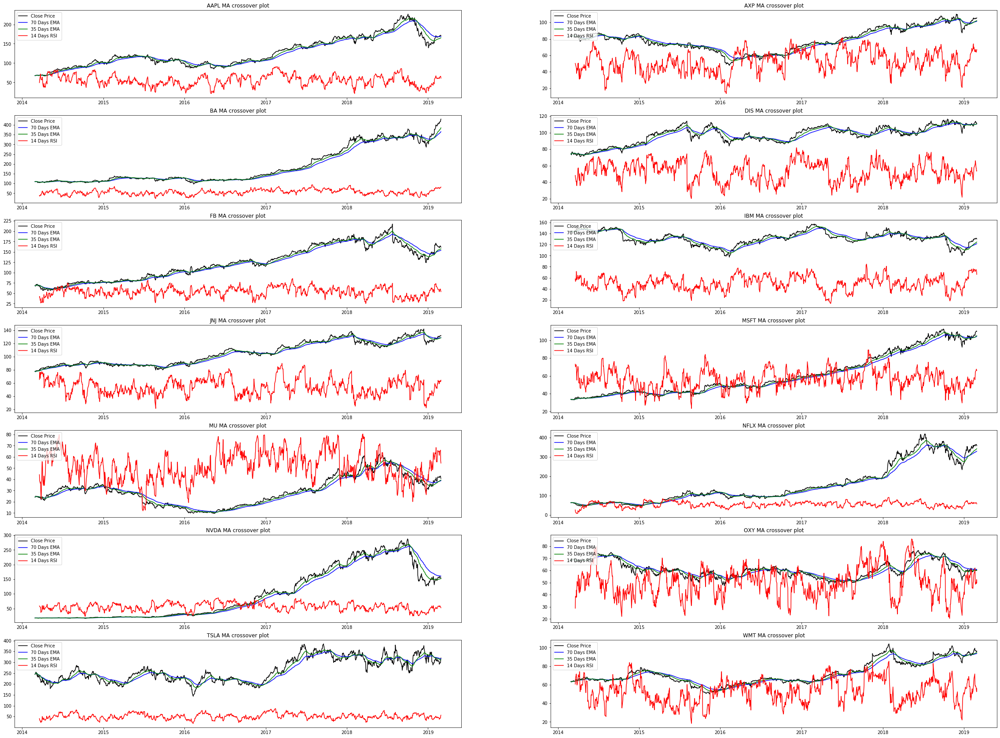

In [32]:
fig, ax = plt.subplots(nrows=len(new_tickers_list)//2, ncols= 2, figsize=(40, 30))

idx = 0
for row in ax:
    for col in row:
        ticker = new_tickers_list[idx]
        col.plot(MA_df.index, MA_df[f'{ticker}'],  color = 'black',  label='Close Price')
        col.plot(MA_df.index, MA_df[f'{ticker}_70_EMA'], label='70 Days EMA', color='blue')
        col.plot(MA_df.index, MA_df[f'{ticker}_35_EMA'], label='35 Days EMA', color='green')
        col.plot(MA_df.index, MA_df[f'{ticker}_14_RSI'], label='14 Days RSI', color='red')
        col.title.set_text(ticker + ' MA crossover plot')
        col.legend(loc='upper left')
        idx+=1

## Validate Trading

We validate the above configuration for the rest of 2019

In [11]:
# Download the data
test_set_df = get_close_prices(tickers_list, '2019-03-01', '2019-12-31' )
test_set_df.head()

[*********************100%***********************]  14 of 14 completed


,AAPL,AXP,BA,DIS,FB,IBM,JNJ,MSFT,MU,NFLX,NVDA,OXY,TSLA,WMT
Date,,,,,,,,,,,,,,
2019-02-28,170.451508,105.662270,429.655426,111.477608,161.449997,130.219437,132.012466,110.260048,40.880001,358.100006,153.656174,60.071678,319.880005,96.174522
2019-03-01,172.243118,106.799911,430.299988,112.633484,162.279999,131.228149,133.664566,110.752151,41.580002,357.320007,155.837601,61.343040,294.790009,95.144676
2019-03-04,173.109436,106.897980,422.555725,112.949623,167.369995,130.502258,133.790146,110.486412,41.060001,351.040009,156.166321,61.252224,285.359985,95.066940
2019-03-05,172.794403,106.750870,420.045898,112.623604,171.259995,129.983765,134.070328,109.935257,39.990002,354.299988,155.907349,61.324875,276.540009,95.543007
2019-03-06,171.800171,106.878365,414.518463,113.463341,172.509995,129.135284,134.379486,109.984474,37.930000,359.609985,151.454834,60.108006,276.239990,95.465286


Based on the windowses that were calculated at the optimization stage, the trades are performed below:

In [12]:
test_trade = Trader(test_set_df, 14, 70, 35 , new_tickers_list )    
test_trade.gen_feature_table(False)

In [13]:
portfolio = test_trade.gen_portfolio(10000, 30, 70, plot = False )
for idx in test_set_df.index:
    dt = str(idx.date())
    trade_results = test_trade.trade(dt)
    


/home/andreas/.local/lib/python3.6/site-packages/ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in long_scalars


KeyboardInterrupt: 

In [ ]:
# Head of the dataframe with the trading action and the metrics
trade_results.tail(10)

### Plot Daily Return together with the signals

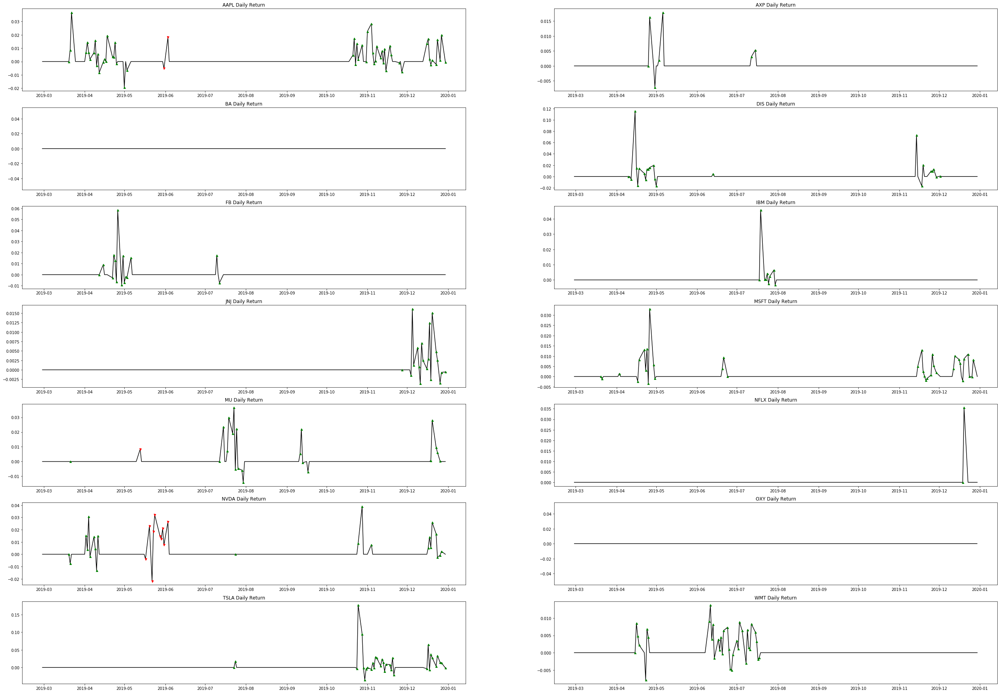

In [24]:
fig, ax = plt.subplots(nrows=len(new_tickers_list)//2, ncols= 2, figsize=(45, 32))
idx = 0
for row in ax:
    for col in row:
        
        ticker = new_tickers_list[idx]
        col.plot(trade_results.index, trade_results[f'{ticker}_Return'],  color = 'black',  label=f'{ticker} Daily Return')
        
        col.plot(trade_results.loc[trade_results[ticker + '_signal_tday'] == 'Buy' ].index,
                    trade_results[f'{ticker}_Return'].loc[trade_results[ticker + '_signal_tday'] == 'Buy' ], '^', markersize = 5, color = 'green')

        col.plot(trade_results.loc[(trade_results[ticker + '_signal_tday'] == 'Sell') & (trade_results[ticker + '_Position_t-1'] >=1 ) ].index,
                    trade_results[f'{ticker}_Return'].loc[(trade_results[ticker + '_signal_tday'] == 'Sell') & (trade_results[ticker + '_Position_t-1'] >= 1 ) ], 'v', markersize = 5, color = 'red')

        col.title.set_text(ticker + ' Daily Return')
        idx+=1

### Plot Price movement with Signals

In [ ]:
fig, ax = plt.subplots(nrows=len(new_tickers_list)//2, ncols= 2, figsize=(45, 32))
idx = 0
for row in ax:
    for col in row:
        
        ticker = new_tickers_list[idx]
        col.plot(trade_results.index, trade_results[ticker],  color = 'black',  label=f'{ticker} Daily Return')
        
        col.plot(trade_results.loc[trade_results[ticker + '_signal_tday'] == 'Buy' ].index,
                    trade_results[ticker].loc[trade_results[ticker + '_signal_tday'] == 'Buy' ], '^', markersize = 5, color = 'green')

        col.plot(trade_results.loc[(trade_results[ticker + '_signal_tday'] == 'Sell') & (trade_results[ticker + '_Position_t-1'] >=1 ) ].index,
                    trade_results[ticker].loc[(trade_results[ticker + '_signal_tday'] == 'Sell') & (trade_results[ticker + '_Position_t-1'] >= 1 ) ], 'v', markersize = 5, color = 'red')

        col.title.set_text(ticker + ' Daily Return')
        idx+=1

### Plot Daily return

In [ ]:
plt.figure( figsize = (12,10) )
plt.plot(trade_results.index, trade_results.Daily_Return)   

### Plot Cumulative Return

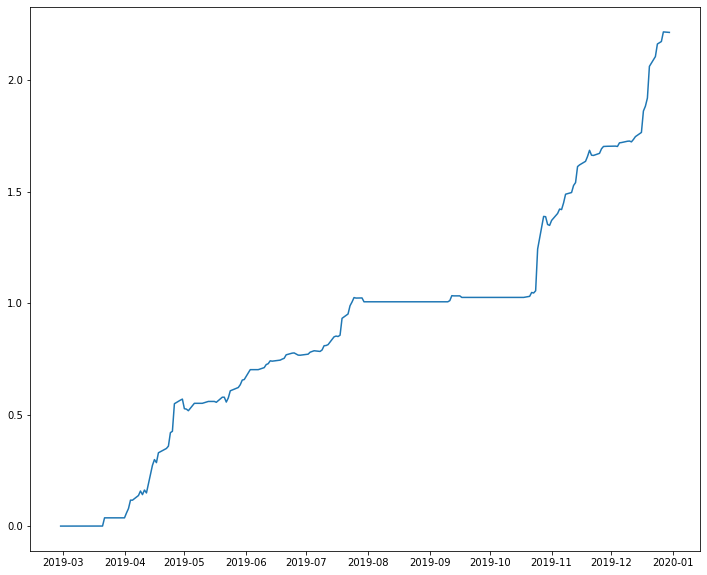

In [21]:
plt.figure( figsize = (12,10) )
plt.plot(trade_results.index, trade_results.cum_Return)               #.to_csv('C:\\Users\\andre\\Desktop\\test.csv')

### Sharpe Ratio

In [ ]:
def SR(df):
    return df.Daily_Return.mean()/df.Daily_Return.std()
    
sr = SR(trade_results)
print('The Sharpe Ratio for the testing period is :', sr)

### Profitable trades percentage

In [ ]:
print('The percentage of the profitable trades is: ', round(trade_results.profit_pc[-1]*100, 3),'%')